# <center> Big Data Fundamentals - Data Storage Networking </center>
## <center> CBD 2214 - Group B </center>
## <center> Assignment 1 - Machine Learning Regression Algorithm </center>

## <center> Phishing Dataset for Machine Learning </center>

<left> About Dataset
    

**Context**

Anti-phishing refers to efforts to block phishing attacks. Phishing is a kind of cybercrime where attackers pose as known or trusted entities and contact individuals through email, text or telephone and ask them to share sensitive information. Typically, in a phishing email attack, and the message will suggest that there is a problem with an invoice, that there has been suspicious activity on an account, or that the user must login to verify an account or password. Users may also be prompted to enter credit card information or bank account details as well as other sensitive data. Once this information is collected, attackers may use it to access accounts, steal data and identities, and download malware onto the user’s computer.

**Content**

This dataset contains 48 features extracted from 5000 phishing webpages and 5000 legitimate webpages, which were downloaded from January to May 2015 and from May to June 2017. An improved feature extraction technique is employed by leveraging the browser automation framework (i.e., Selenium WebDriver), which is more precise and robust compared to the parsing approach based on regular expressions.

Anti-phishing researchers and experts may find this dataset useful for phishing features analysis, conducting rapid proof of concept experiments or benchmarking phishing classification models. </left>

## 1. Import modules requiered

In [1]:
!pip install autoviz

     ---------------------------------------- 67.0/67.0 kB 1.8 MB/s eta 0:00:00
     ---------------------------------------- 1.6/1.6 MB 376.3 kB/s eta 0:00:00
     ------------------------------------ 636.8/636.8 kB 313.3 kB/s eta 0:00:00
     ---------------------------------------- 4.3/4.3 MB 341.3 kB/s eta 0:00:00
     ------------------------------------ 361.8/361.8 kB 261.6 kB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
     -------------------------------------- 96.5/96.5 kB 324.4 kB/s eta 0:00:00
     ---------------------------------------- 3.1/3.1 MB 370.6 kB/s eta 0:00:00
  Created wheel for emoji: filename=emoji-2.7.0-py2.py3-none-any.whl size=356589 sha256=761ac10a45baa99d9ae605

In [2]:
!pip install dtale

     -------------------------------------- 14.2/14.2 MB 321.0 kB/s eta 0:00:00
     -------------------------------------- 65.9/65.9 MB 292.2 kB/s eta 0:00:00
     -------------------------------------- 45.9/45.9 kB 190.5 kB/s eta 0:00:00
     -------------------------------------- 10.4/10.4 MB 314.4 kB/s eta 0:00:00
     ------------------------------------ 642.7/642.7 kB 245.2 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ------------------------------------ 219.7/219.7 kB 268.2 kB/s eta 0:00:00
     -------------------------------------- 62.3/62.3 kB 416.9 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ------------------------------------ 383.3/383.3 kB 341.0 kB/s eta 0:00:00
  Created wheel for dash-colorscales: filename=dash_colorscales-0.0.4-py3-none-any.whl size=62573 sha256=ec780d57e7c75b6809cab956ba1e6342bc57386f601c2039836

In [18]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

from autoviz.AutoViz_Class import AutoViz_Class
import dtale
import dtale.app as dtale_app

## 2. Read data into a DataFrame

In [4]:
# Loading dataset 
df = pd.read_csv(r"C:\Users\HP\Desktop\Big Data - CBD Subject\Assignment 2 - Group B - Scam\Phishing_Legitimate_full.csv\Phishing_Legitimate_full.csv")

In [5]:
df.head()

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
0,1,3,1,5,72,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,21,44,0,0,0,0,0.000,0.250000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,1,1,0,1,1,-1,1,1
1,2,3,1,3,144,0,0,0,0,2,0,2,1,0,41,1,0,0,0,0,0,17,16,103,0,1,0,0.000,0.000000,0,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,-1,1,1,1,1,1
2,3,3,1,2,58,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,27,24,0,0,0,0,0.375,1.000000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,0,-1,1,-1,0,1
3,4,3,1,6,79,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,22,50,0,0,0,1,1.000,0.095238,1,1,0,0,0,0.0,1,0,0,0,1,0,0,0,1,-1,1,1,1,-1,1
4,5,3,0,4,46,0,0,0,0,0,0,0,0,0,2,1,1,0,0,1,0,10,29,0,0,0,0,1.000,1.000000,0,0,0,1,0,0.0,1,0,0,0,0,1,0,0,1,1,-1,0,-1,-1,1


<div class="alert alert-block alert-info">
<b>Note: </b> 
    
**We check the first  rows of the DataFrame. We can see that we have: 50 columns including id and CLASS_LABEL columns.** 
</div>

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 50 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   id                                  10000 non-null  int64  
 1   NumDots                             10000 non-null  int64  
 2   SubdomainLevel                      10000 non-null  int64  
 3   PathLevel                           10000 non-null  int64  
 4   UrlLength                           10000 non-null  int64  
 5   NumDash                             10000 non-null  int64  
 6   NumDashInHostname                   10000 non-null  int64  
 7   AtSymbol                            10000 non-null  int64  
 8   TildeSymbol                         10000 non-null  int64  
 9   NumUnderscore                       10000 non-null  int64  
 10  NumPercent                          10000 non-null  int64  
 11  NumQueryComponents                  10000 

<div class="alert alert-block alert-info">
<b>Note: </b> 
    
- As described, we have 10000 observations and 50 attributes including ID and CLASS_LABEL columns.
    
- We can see that all columns are numerical but we should explore to see anything special about their data type
    
- We don't have missing values in this case.
</div>

In [7]:
df.drop('id', axis = 1).describe().T

,count,mean,std,min,25%,50%,75%,max
NumDots,10000.0,2.445100,1.346836,1.0,2.000000,2.000000,3.000000,21.0
SubdomainLevel,10000.0,0.586800,0.751214,0.0,0.000000,1.000000,1.000000,14.0
PathLevel,10000.0,3.300300,1.863241,0.0,2.000000,3.000000,4.000000,18.0
UrlLength,10000.0,70.264100,33.369877,12.0,48.000000,62.000000,84.000000,253.0
NumDash,10000.0,1.818000,3.106258,0.0,0.000000,0.000000,2.000000,55.0
NumDashInHostname,10000.0,0.138900,0.545744,0.0,0.000000,0.000000,0.000000,9.0
AtSymbol,10000.0,0.000300,0.017319,0.0,0.000000,0.000000,0.000000,1.0
TildeSymbol,10000.0,0.013100,0.113709,0.0,0.000000,0.000000,0.000000,1.0
NumUnderscore,10000.0,0.323200,1.114660,0.0,0.000000,0.000000,0.000000,18.0
NumPercent,10000.0,0.073800,0.622248,0.0,0.000000,0.000000,0.000000,19.0


<div class="alert alert-block alert-info">
<b>Note: </b> 
    
- Regarding the above summary, we can see the majority of features are having only two unique values 0 and 1, the rest is having more than 2 unique values.
    
- We also spot there are outliers on some features HostnameLength, PathLength, QueryLength, and more. We should go explore it later.
</div>

## 3. Exploring the data (EDA)

In [8]:
# Drop id and CLASS_LABEL columns to explore our data
train_df = df.drop(['id', 'CLASS_LABEL'], axis = 1)

### 3.1 Data Types

In [9]:
# Get the number of unique values for each column
unique = train_df.nunique().sort_values(ascending=True).reset_index().rename(columns = {'index': 'Feature', 0: 'Unique_Count'})
unique

,Feature,Unique_Count
0,HttpsInHostname,1
1,DoubleSlashInPath,2
2,EmbeddedBrandName,2
3,RelativeFormAction,2
4,ExtFormAction,2
5,AbnormalFormAction,2
6,FrequentDomainNameMismatch,2
7,FakeLinkInStatusBar,2
8,DomainInPaths,2
9,DomainInSubdomains,2


In [10]:
# Separate features into correct data types
categorical_features = unique[(unique['Unique_Count'] <10)]['Feature'].tolist()

high_cardinality_features = unique[(unique['Unique_Count'] >= 10) & (unique['Unique_Count'] <=20)]['Feature'].tolist()

numeric_features=unique[(unique['Unique_Count'] > 20)]['Feature'].tolist()

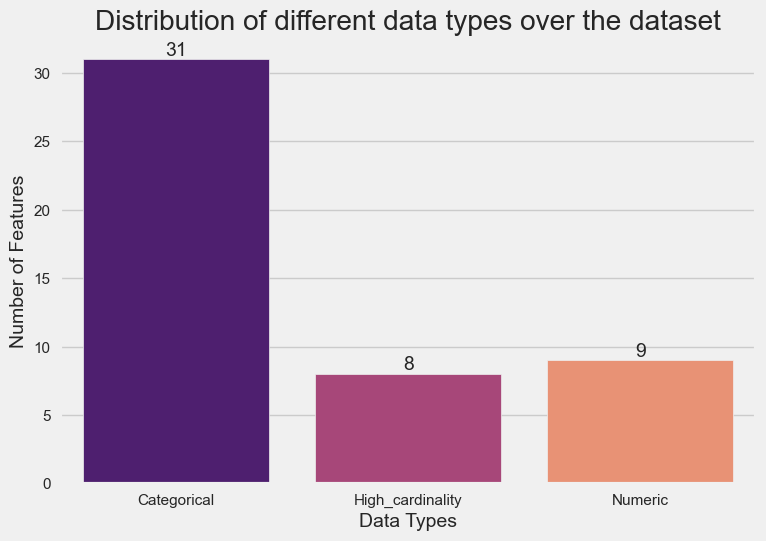

In [23]:
# Find the number of features based on their data types
data_types = ['Categorical', 'High_cardinality', 'Numeric']
num_lst = [len(categorical_features), len(high_cardinality_features), len(numeric_features)]

# Plotting the graph showing the difference between data types
plot = sns.barplot(x = data_types, y = num_lst, palette = 'magma')

# Show value for each bar in the graph
plot.bar_label(plot.containers[0])

plt.title('Distribution of different data types over the dataset')
plt.xlabel('Data Types')
plt.ylabel('Number of Features')
plt.show()

<div class="alert alert-block alert-info">
<b>Note: </b> 
    
We divide the data types into three different types: Categorical, High-cardinality and Numeric. Now we might preprocess these data types differently
</div>

### Imbalance Dataset

In [13]:
df[df['CLASS_LABEL'] == 1].shape, df[df['CLASS_LABEL'] == 0].shape

((5000, 50), (5000, 50))

<div class="alert alert-block alert-info">
<b>Note: </b> 
    
- We have balanced dataset in this case
</div>

### Features' skewness

In [14]:
train_df[numeric_features].skew()

NumDash                          2.791907
HostnameLength                   3.228785
NumNumericChars                  3.463138
PathLength                       1.278643
QueryLength                      3.802741
UrlLength                        1.705009
PctNullSelfRedirectHyperlinks    2.252141
PctExtResourceUrls               0.536532
PctExtHyperlinks                 1.372615
dtype: float64

<div class="alert alert-block alert-info">
<b>Note: </b> 
    
- We might apply log transformation for these numerical features to reduce their skewness and their distributions will become close to normal, then a reference interval might be determined.
</div>

### Histogram for numeric features

array([[<Axes: title={'center': 'NumDash'}>,
        <Axes: title={'center': 'HostnameLength'}>,
        <Axes: title={'center': 'NumNumericChars'}>],
       [<Axes: title={'center': 'PathLength'}>,
        <Axes: title={'center': 'QueryLength'}>,
        <Axes: title={'center': 'UrlLength'}>],
       [<Axes: title={'center': 'PctNullSelfRedirectHyperlinks'}>,
        <Axes: title={'center': 'PctExtResourceUrls'}>,
        <Axes: title={'center': 'PctExtHyperlinks'}>]], dtype=object)

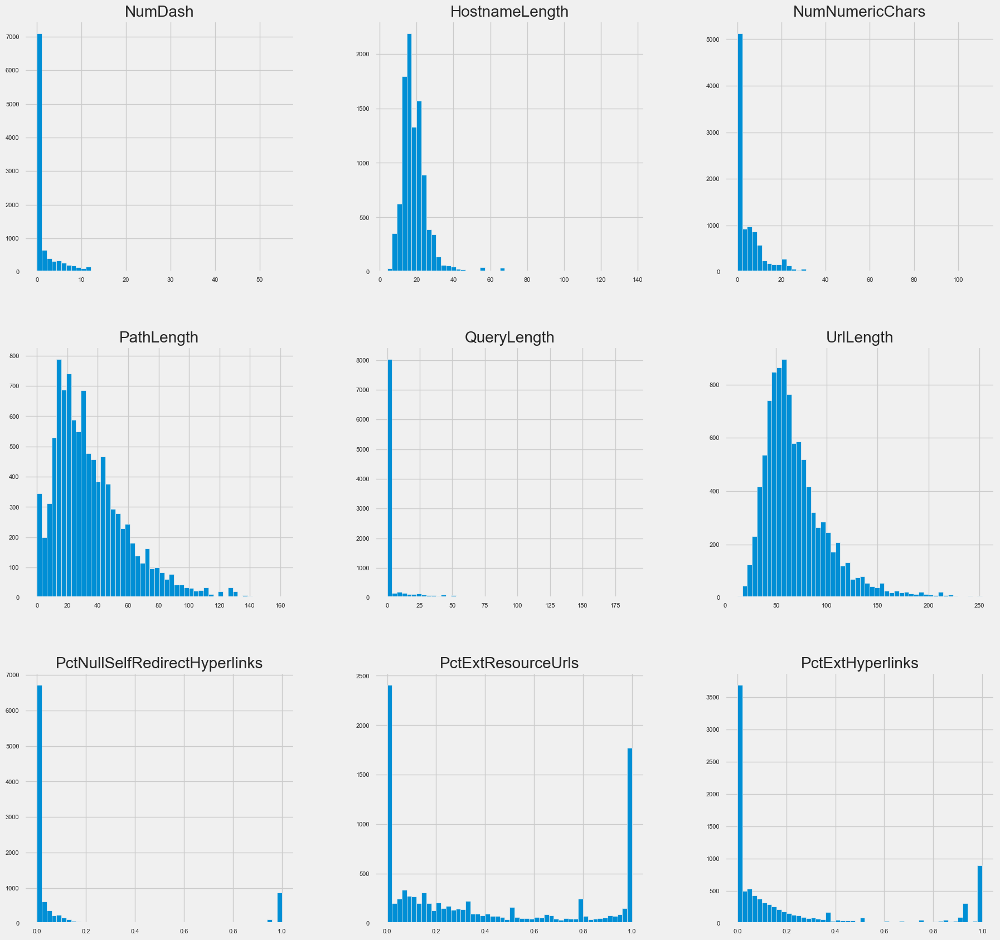

In [20]:
train_df[numeric_features].hist(figsize = (20, 20), bins = 50, xlabelsize = 8, ylabelsize = 8)

### Histograms for high cardinality features

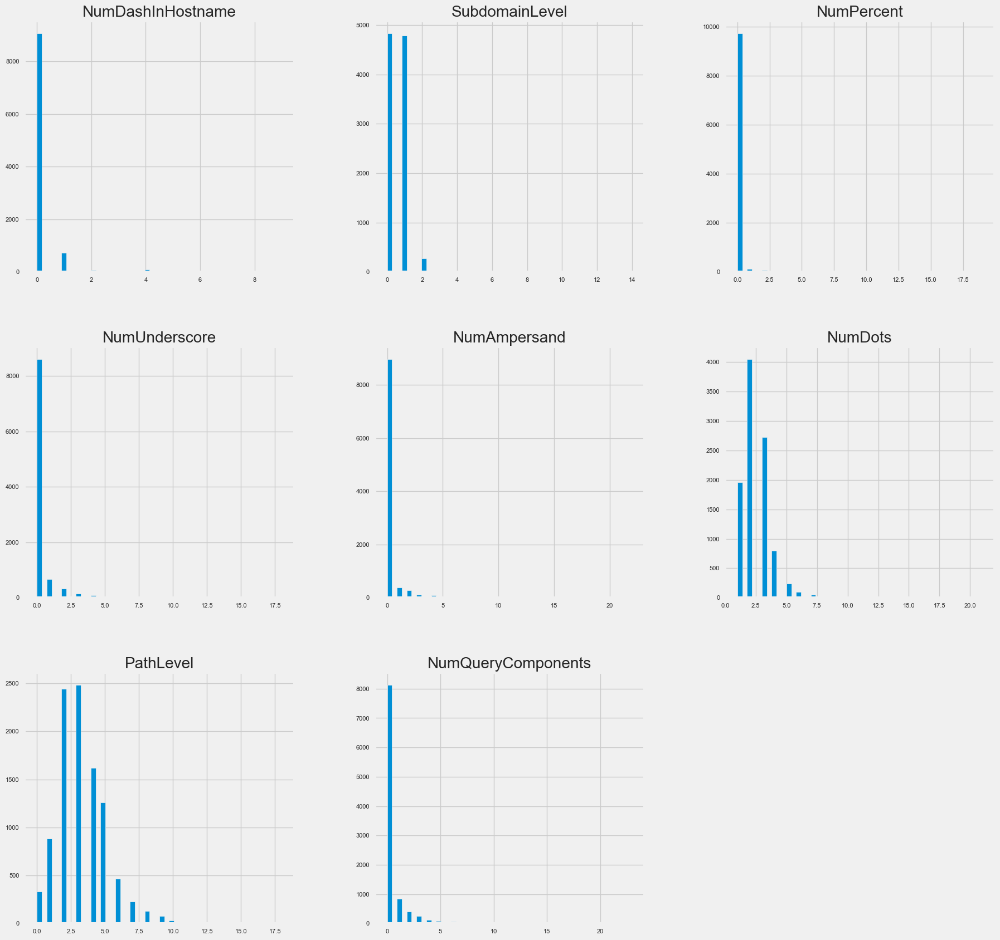

In [21]:
train_df[high_cardinality_features].hist(figsize = (20, 20), bins = 50, xlabelsize = 8, ylabelsize = 8);

## 4. Data Split-up for Semi-supervised Learning

<div class="alert alert-block alert-info">
<b>Important Note: </b> 
    
- Dividing data in 3:7 ration with 30% data as labeled and the rest as unlabeled.
</div>

In [25]:
# Split up the labeled and unlabeled data
from sklearn.model_selection import train_test_split
data_labeled, data_unlabeled = train_test_split(df, test_size=0.7, random_state=42)

In [29]:
# Double check the balance for CLASS LABEL for labeled data
data_labeled['CLASS_LABEL'].value_counts()

0    1554
1    1446
Name: CLASS_LABEL, dtype: int64

In [30]:
# Double check the balance for CLASS LABEL for labeled data
data_unlabeled['CLASS_LABEL'].value_counts()

1    3554
0    3446
Name: CLASS_LABEL, dtype: int64

In [31]:
# Separate the label columns for unlabeled data as the final actual label for comparison
labels = data_unlabeled['CLASS_LABEL'] 
data_unlabeled.drop(['CLASS_LABEL'], axis = 1, inplace =True)

### Using AutoViz for EDA on data_labeled

In [32]:
data_labeled.to_csv(r'C:\Users\HP\Desktop\Big Data - CBD Subject\Assignment 2 - Group B - Scam\Phishing_Legitimate_full.csv\data_labeled.csv')

In [33]:
AV = AutoViz_Class()

Shape of your Data Set loaded: (3000, 51)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    51 Predictors classified...
        4 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Unnamed: 0', 'id', 'AtSymbol', 'HttpsInHostname']
3 numeric variables in data exceeds limit, taking top 30 variables
    List of variables selected: ['PctExtHyperlinks', 'PctExtResourceUrls', 'PctNullSelfRedirectHyperlinks']
   Total columns > 30, too numerous to print.
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Unnamed: 0,int64,0.000000,100,1.000000,9997.000000,Possible ID colum: drop before modeling process.
id,int64,0.000000,100,2.000000,9998.000000,"Possible ID colum: drop before modeling process., has a high correlation with ['Unnamed: 0']. Consider dropping one of them."
NumDots,int64,0.000000,0,1.000000,15.000000,has 121 outliers greater than upper bound (4.50) or lower than lower bound(0.50). Cap them or remove them.
SubdomainLevel,int64,0.000000,0,0.000000,10.000000,has 26 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
PathLevel,int64,0.000000,0,0.000000,18.000000,has 82 outliers greater than upper bound (7.00) or lower than lower bound(-1.00). Cap them or remove them.
UrlLength,int64,0.000000,6,12.000000,252.000000,has 126 outliers greater than upper bound (138.00) or lower than lower bound(-6.00). Cap them or remove them.
NumDash,int64,0.000000,0,0.000000,23.000000,has 395 outliers greater than upper bound (5.00) or lower than lower bound(-3.00). Cap them or remove them.
NumDashInHostname,int64,0.000000,0,0.000000,7.000000,has 282 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
AtSymbol,int64,0.000000,0,0.000000,0.000000,Zero-variance colum: drop before modeling process.
TildeSymbol,int64,0.000000,0,0.000000,1.000000,has 42 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.


Number of All Scatter Plots = 6


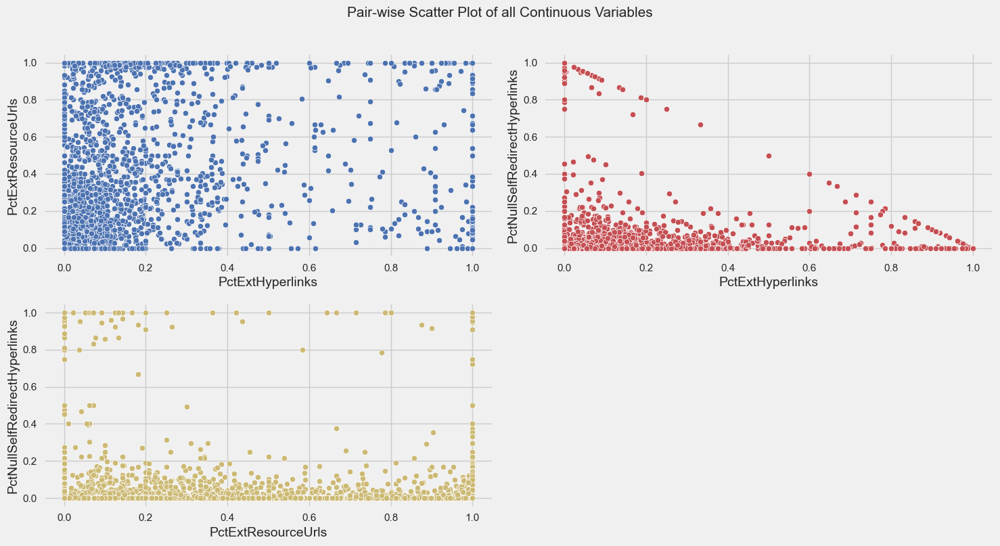

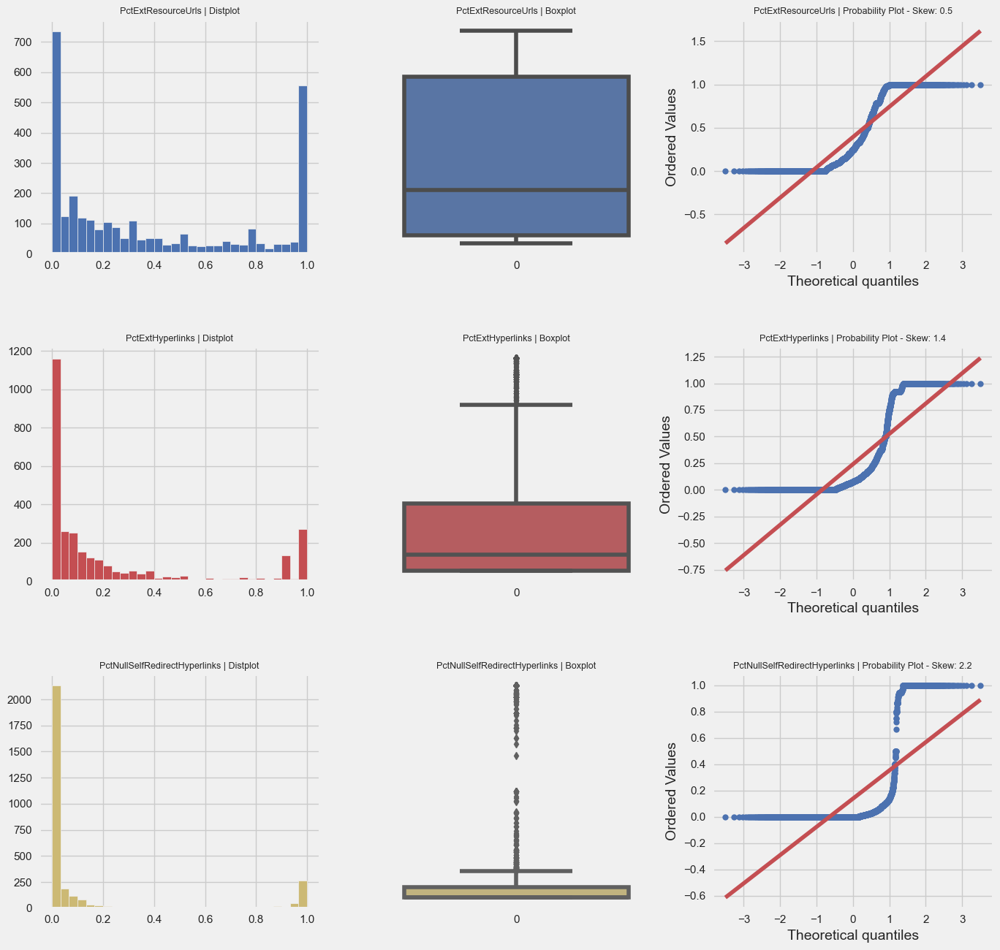

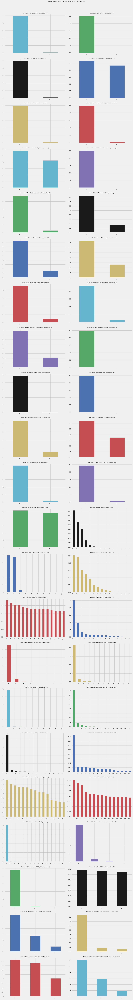

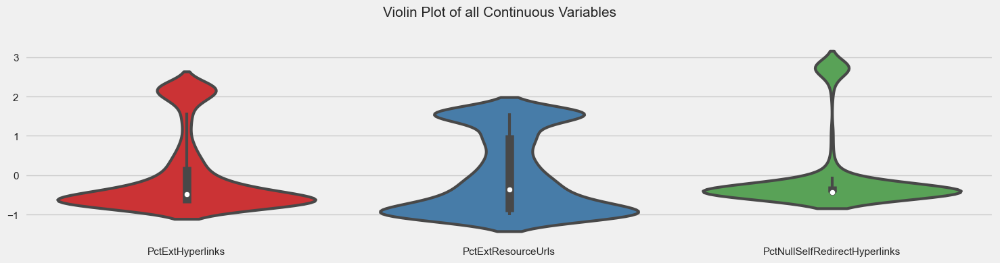

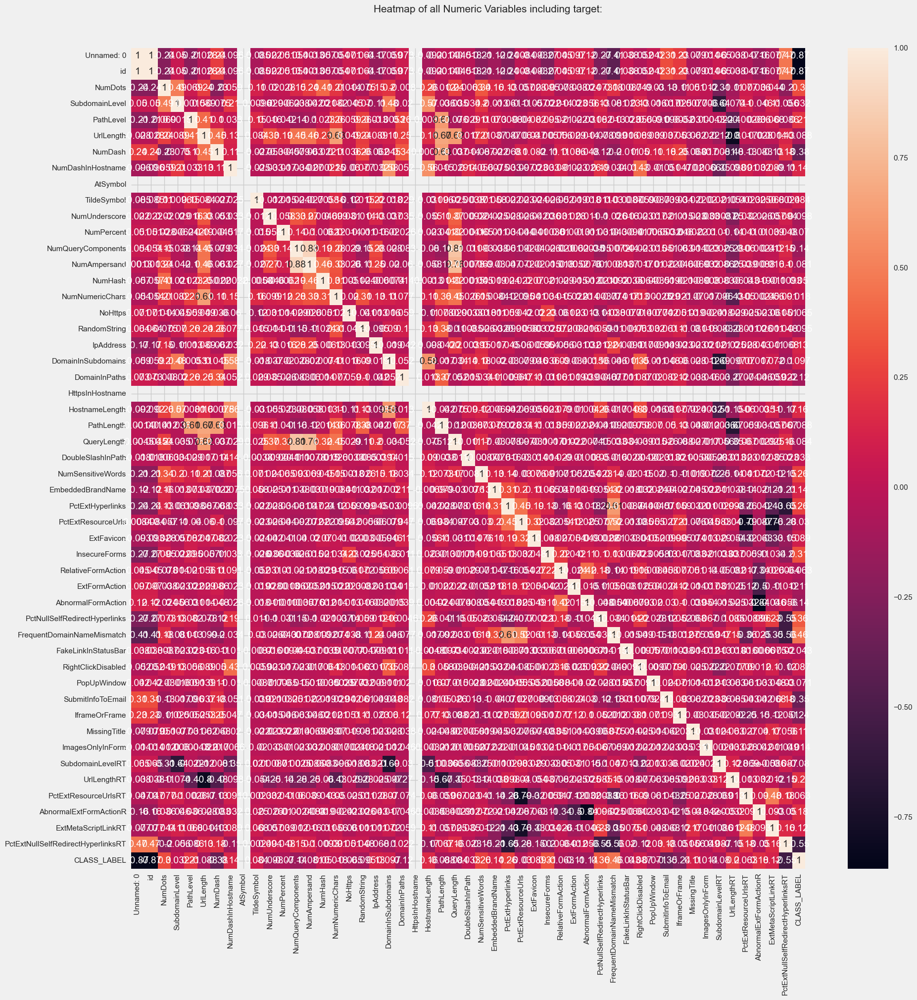

All Plots done
Time to run AutoViz = 69 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [34]:
import matplotlib.pyplot as plt
%matplotlib inline
filename = r"C:\Users\HP\Desktop\Big Data - CBD Subject\Assignment 2 - Group B - Scam\Phishing_Legitimate_full.csv\data_labeled.csv"
sep = ","
dft = AV.AutoViz(filename)

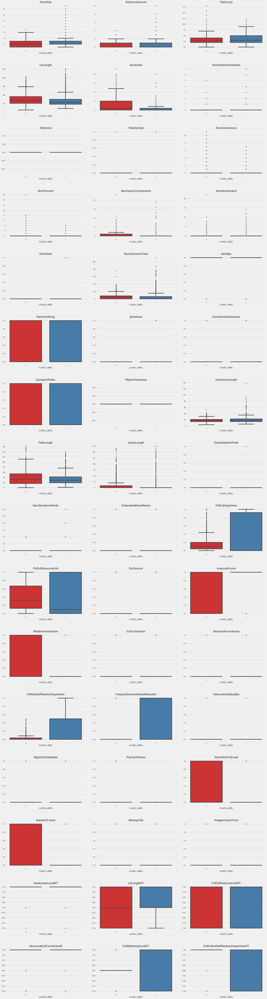

In [35]:
import math

df2 = data_labeled.copy()

num_cols_filtered = data_labeled.drop(["id", "CLASS_LABEL"], axis = 1).columns

num_plots = len(num_cols_filtered)
num_rows = math.ceil(num_plots / 3)

fig, ax = plt.subplots(num_rows, 3, figsize=(28,100))
ax = ax.flatten()

for idx, c in enumerate(num_cols_filtered):
    ax[idx].set_title(c)
    sns.boxplot(x='CLASS_LABEL', y=c, data=df2, ax=ax[idx])
    ax[idx].set_ylabel('')

for i in range(len(num_cols_filtered), len(ax)):
    ax[i].axis('off')

plt.tight_layout(pad=5, w_pad=3, h_pad=5)  # Increase padding between subplots
plt.show()


<div class="alert alert-block alert-info">
<b>Final Observation for EDA: </b> 
    
- in this case of our dataset, we do not experience missing values, duplicated values and imbalanced dataset.
    
- However, by analyzing the data types based on the number of unique valuesabove, we consider that there are three different data types present in our dataset, including categorical, high-cardinality and numeric data types.
    
- For categorical features, these features are already pre-processed by using one-hot encoder to convert the string values to the type that can be fed into machine learning model. Thus, there is no need to deal with these features.
    
- For high-cardinality features, the number of unique values falls in the range from 10 to 20 inclusively. Similarly wiht categorical features above, we dont have any further data processing for these features
    
- For numerical features, we experience outliers which somehow cause skewnesses for these features as shown above. However, as we are analyzing phishing website and we think some of outliers could potentially contribute to the further analysis when using semi-supervised learning. Therefore, we might keep the data as original for now for semi-supervised learning. Besides, when we d the Kmeans clustering for our unsupervised approach, we do have to use log-transformation for these numeric features
</div>

## 5. Build model

### 5.1 Semi-supervised Learning _ Self-training Approach

![](https://content.altexsoft.com/media/2022/03/supervised-vs-unsupervised-vs-semi-supervised-mach.png.webp)

In [38]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score

In [39]:
from sklearn.model_selection import train_test_split

# sperate variables and prediction
y = data_labeled['CLASS_LABEL']
x = data_labeled.drop(['CLASS_LABEL', 'id'], axis = 1)

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=1000)

In [40]:
x_train.head()

,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT
7071,1,0,4,154,11,0,0,0,0,0,0,0,0,4,1,1,0,0,1,0,8,139,0,0,0,0,0.213333,0.153846,0,1,0,0,0,0.040000,0,0,0,0,1,1,0,0,1,-1,1,1,1,1
2745,3,1,4,65,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,25,33,0,0,0,0,0.000000,0.000000,0,1,0,0,0,1.000000,0,0,0,0,0,0,0,0,1,0,1,1,1,-1
7002,3,1,1,77,0,0,0,0,0,0,5,4,0,14,1,1,0,0,0,0,19,10,40,0,0,0,0.032258,0.142857,0,1,0,0,0,0.000000,0,0,0,0,1,0,0,0,1,-1,1,1,1,1
7527,2,1,4,101,9,0,0,0,0,0,0,0,0,6,1,1,0,0,1,0,19,75,0,0,0,0,0.266667,0.206897,0,1,0,0,0,0.040000,0,0,0,0,1,1,0,0,1,-1,1,1,0,1
6636,1,0,5,81,0,0,0,1,2,0,0,0,0,9,1,1,0,0,1,0,17,57,0,0,0,0,0.086364,0.142857,0,0,0,0,0,0.009091,0,0,0,0,0,0,0,0,1,-1,0,1,1,1


#### Decision Tree Classifier

In [60]:
from sklearn.tree import DecisionTreeClassifier
treemodel = DecisionTreeClassifier()
treemodel.fit(x_train,y_train)
y_pred_treemodel = treemodel.predict(x_test)

print("R2 Score for Decision Tree Classifier: ", accuracy_score(y_test, y_pred_treemodel))

R2 Score for Decision Tree Classifier:  0.955


#### Random Forest Classifier

In [61]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
rfc.fit(x_train, y_train)
y_pred_rfc = rfc.predict(x_test)

print("R2 Score for Random Forest Classifier: ",accuracy_score(y_test, y_pred_rfc))

R2 Score for Random Forest Classifier:  0.9783333333333334


#### Logistic Regression

In [62]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(max_iter=1000)
lr.fit(x_train,y_train)
y_pred_lr = lr.predict(x_test)

print("R2 Score for LogisticRegression: ", accuracy_score(y_test, y_pred_lr))

R2 Score for LogisticRegression:  0.9416666666666667


#### Voting Classifier based on DT, RF and LR

In [63]:
estimators = [('lr', lr), ('rf', rfc), ('dt',treemodel)]

from sklearn.ensemble import VotingClassifier
vc = VotingClassifier(estimators = estimators, voting='hard')
vc.fit(x_train,y_train)

y_pred_vc = vc.predict(x_test)

print("R2 Score for Voting Classifier: ",accuracy_score(y_pred_vc, y_test))

R2 Score for Voting Classifier:  0.9783333333333334


#### ADAboost Classifier

In [64]:
# ADAboost Classifier
from sklearn.ensemble import AdaBoostClassifier
ADA_model = AdaBoostClassifier(learning_rate=0.25, n_estimators= 140, random_state=2022)
ADA_model.fit(x_train,y_train)

y_pred_ADA = ADA_model.predict(x_test)

print("R2 Score for ADAboost Classifier: ", accuracy_score(y_test, y_pred_ADA))

R2 Score for ADAboost Classifier:  0.9733333333333334


#### Gradient Boosting Classifier

In [65]:
from sklearn.ensemble import GradientBoostingClassifier
GBDT_model = GradientBoostingClassifier(random_state=2023)
GBDT_model.fit(x_train,y_train)

y_pred_GBDT = GBDT_model.predict(x_test)

print("R2 Score for Gradient Boosting Classifier: ", accuracy_score(y_test, y_pred_GBDT))

R2 Score for Gradient Boosting Classifier:  0.9783333333333334


#### XGB

In [66]:
import xgboost as xgb
xgb_model = xgb.XGBClassifier(random_state = 2023)
xgb_model.fit(x_train,y_train)

y_pred_xgb = xgb_model.predict(x_test)

print("R2 Score for XGB: ", accuracy_score(y_test, y_pred_xgb))

R2 Score for XGB:  0.985


#### Extra Trees Classifier

In [67]:
from sklearn.ensemble import ExtraTreesClassifier

model = ExtraTreesClassifier(random_state=2022)
model.fit(x_train, y_train)
y_pred_etc = model.predict(x_test)

print("R2 Score for Extra Trees Classifier: ", accuracy_score(y_test, y_pred_etc))

R2 Score for Extra Trees Classifier:  0.9716666666666667


In [68]:
from tabulate import tabulate

roc_data = pd.DataFrame([['Descision Trees', accuracy_score(y_pred_treemodel,y_test)],
                         ['Random Forest Classifier', accuracy_score(y_pred_rfc,y_test)],
                         ['Logistic Regression', accuracy_score(y_pred_lr,y_test)],
                         ['Voting Classifier', accuracy_score(y_pred_vc, y_test)],
                         ['ADABosst', accuracy_score(y_pred_ADA,y_test)],
                         ['Gradient Boost Classifer', accuracy_score(y_pred_GBDT,y_test)],
                         ['XGB', accuracy_score(y_pred_xgb,y_test)],
                         ['Extra Trees Classifier',accuracy_score(y_pred_etc,y_test)]],
                        columns=['Algorithm','accuracy_score'])

print(tabulate(roc_data, headers='keys', tablefmt='pretty', showindex=False))
roc_data.to_excel('Model_Performance.xlsx', index=False)

+--------------------------+--------------------+
|        Algorithm         |   accuracy_score   |
+--------------------------+--------------------+
|     Descision Trees      |       0.955        |
| Random Forest Classifier | 0.9783333333333334 |
|   Logistic Regression    | 0.9416666666666667 |
|    Voting Classifier     | 0.9783333333333334 |
|         ADABosst         | 0.9733333333333334 |
| Gradient Boost Classifer | 0.9783333333333334 |
|           XGB            |       0.985        |
|  Extra Trees Classifier  | 0.9716666666666667 |
+--------------------------+--------------------+


<div class="alert alert-block alert-info">
<b>First Observation: </b> 
    
- We can see that all models are performing pretty well on the labeled_data with the accuracy score above 90%. 
    
- The best performance among all models is XGB. Then we decided to choose XGB for further steps in our analysis.
</div>

#### XGB Hyperparameter Tuning

In [54]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
import xgboost as xgb
xgb_model = xgb.XGBClassifier(random_state = 2023)

params = {
    'n_estimators': [100, 200, 500],
    'learning_rate': [0.01,0.05,0.1],
    'booster': ['gbtree', 'gblinear'],
    'gamma': [0, 0.5, 1],
    'reg_alpha': [0, 0.5, 1],
    'reg_lambda': [0.5, 1, 5],
    'base_score': [0.2, 0.5, 1]
}

gs2 = GridSearchCV(xgb_model, params, cv=KFold(n_splits=3), scoring='roc_auc', verbose = 3)
gs2.fit(x_train, y_train)
gs2.best_params_

Fitting 3 folds for each of 1458 candidates, totalling 4374 fits
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.990 total time=   0.2s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.987 total time=   0.1s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.985 total time=   0.1s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.990 total time=   0.1s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.985 total time=   0.1s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.982 total time=   0.1s
[CV 1/3] END base_score

[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.997 total time=   1.1s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.993 total time=   1.0s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.996 total time=   1.1s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   1.1s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.994 total time=   1.1s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   1.0s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=5

[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.998 total time=   0.3s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.995 total time=   0.3s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.997 total time=   0.3s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.998 total time=   0.3s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.994 total time=   0.3s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.3s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=2

[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.998 total time=   0.1s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.995 total time=   0.1s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.996 total time=   0.1s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.998 total time=   0.1s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   0.1s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.1s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg

[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.995 total time=   0.6s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.997 total time=   0.6s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.999 total time=   0.7s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   0.7s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.7s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.999 total time=   0.8s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_a

[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.989 total time=   0.4s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.991 total time=   0.4s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.993 total time=   0.4s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.991 total time=   0.4s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.991 total time=   0.4s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.992 total time=   0.4s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0.5, learning_rate=0.01, n_

[CV 2/3] END base_score=0.2, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.994 total time=   0.1s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.995 total time=   0.1s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.1s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.996 total time=   1.0s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.997 total time=   1.0s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.994 total time=   1.0s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.01, n_estimato

[CV 3/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.997 total time=   0.3s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.998 total time=   0.3s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.994 total time=   0.3s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.3s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.998 total time=   0.3s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.994 total time=   0.3s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, 

[CV 3/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.997 total time=   0.1s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.998 total time=   0.1s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   0.1s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.1s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.998 total time=   0.1s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.994 total time=   0.1s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alp

[CV 1/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.998 total time=   1.0s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   0.9s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.9s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.998 total time=  55.4s
[CV 2/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.994 total time=   0.8s
[CV 3/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.996 total time=   0.8s
[CV 1/3] END base_score=0.2, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.513 total time=   0.0s
[16:00:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.513 total time=   0.0s
[16:00:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.480 total time=   0.0s
[16:00:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learne

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.620 total time=   0.0s
[16:00:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.608 total time=   0.0s
[16:00:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.579 total time=   0.0s
[16:00:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learne

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.697 total time=   0.1s
[16:00:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.679 total time=   0.1s
[16:00:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.646 total time=   0.1s
[16:00:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.813 total time=   0.0s
[16:00:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.795 total time=   0.0s
[16:00:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=0.5;, score=0.699 total time=   0.0s
[16:00:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.810 total time=   0.0s
[16:00:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.805 total time=   0.0s
[16:00:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.786 total time=   0.0s
[16:00:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:7

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.908 total time=   0.1s
[16:00:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.887 total time=   0.1s
[16:00:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.889 total time=   0.1s
[16:00:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:7

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.910 total time=   0.0s
[16:00:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.889 total time=   0.0s
[16:00:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.895 total time=   0.0s
[16:00:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767:

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.931 total time=   0.0s
[16:00:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.906 total time=   0.0s
[16:00:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.918 total time=   0.0s
[16:00:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.c

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=200, reg_alpha=1, reg_lambda=5;, score=0.585 total time=   0.0s
[16:00:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=200, reg_alpha=1, reg_lambda=5;, score=0.589 total time=   0.0s
[16:00:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=200, reg_alpha=1, reg_lambda=5;, score=0.608 total time=   0.0s
[16:00:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767:

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=1;, score=0.584 total time=   0.1s
[16:00:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=1;, score=0.588 total time=   0.1s
[16:00:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=1;, score=0.607 total time=   0.1s
[16:00:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767:

[16:00:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alpha=1, reg_lambda=0.5;, score=0.454 total time=   0.0s
[16:00:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alpha=1, reg_lambda=1;, score=0.487 total time=   0.0s
[16:00:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alp

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=0.509 total time=   0.0s
[16:00:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=0.498 total time=   0.0s
[16:00:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=0.470 total time=   0.0s
[16:00:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=0.654 total time=   0.1s
[16:00:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=0.628 total time=   0.1s
[16:00:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=0.595 total time=   0.1s
[16:00:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.656 total time=   0.0s
[16:00:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.631 total time=   0.0s
[16:00:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.598 total time=   0.0s
[16:00:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.707 total time=   0.0s
[16:00:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.696 total time=   0.0s
[16:00:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.658 total time=   0.0s
[16:00:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.721 total time=   0.1s
[16:00:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.741 total time=   0.1s
[16:00:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.716 total time=   0.1s
[16:00:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-window

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.806 total time=   0.0s
[16:00:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.787 total time=   0.0s
[16:00:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=0.5;, score=0.717 total time=   0.0s
[16:00:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learn

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.801 total time=   0.0s
[16:00:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.804 total time=   0.0s
[16:00:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.785 total time=   0.0s
[16:00:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.c

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.908 total time=   0.1s
[16:00:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.887 total time=   0.1s
[16:00:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.887 total time=   0.1s
[16:00:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.c

[16:01:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.940 total time=   0.0s
[16:01:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.917 total time=   0.0s
[16:01:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=1, reg_lambda=1;, score=0.454 total time=   0.0s
[16:01:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=1, reg_lambda=5;, score=0.484 total time=   0.0s
[16:01:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=1, reg_lambda=5;, score=0.477 total time=   0.0s
[16:01:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:7

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=0.508 total time=   0.0s
[16:01:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=0.497 total time=   0.0s
[16:01:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=0.469 total time=   0.0s
[16:01:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:7

[16:01:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=1, reg_lambda=0.5;, score=0.544 total time=   0.1s
[16:01:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=1, reg_lambda=0.5;, score=0.520 total time=   0.1s
[16:01:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=1

[16:01:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.631 total time=   0.0s
[16:01:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.597 total time=   0.0s
[16:01:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=1

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.707 total time=   0.0s
[16:01:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.696 total time=   0.0s
[16:01:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.658 total time=   0.0s
[16:01:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learne

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.721 total time=   0.1s
[16:01:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.741 total time=   0.1s
[16:01:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.716 total time=   0.1s
[16:01:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.805 total time=   0.0s
[16:01:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.787 total time=   0.0s
[16:01:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=0.5;, score=0.717 total time=   0.0s
[16:01:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.801 total time=   0.0s
[16:01:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.804 total time=   0.0s
[16:01:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.785 total time=   0.0s
[16:01:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767:

[CV 1/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.908 total time=   0.1s
[16:01:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.887 total time=   0.1s
[16:01:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.2, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.887 total time=   0.1s
[16:01:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767:

[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.987 total time=   0.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.985 total time=   0.2s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.988 total time=   0.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.983 total time=   0.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.985 total time=   0.1s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.986 total time=   0.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100

[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.994 total time=   1.0s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.995 total time=   1.0s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   1.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.994 total time=   1.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   1.1s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.997 total time=   1.0s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=500

[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.995 total time=   0.3s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.996 total time=   0.3s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.998 total time=   0.3s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   0.3s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.996 total time=   0.3s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.998 total time=   0.3s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=200

[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.995 total time=   0.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.997 total time=   0.1s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.998 total time=   0.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   0.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.996 total time=   0.1s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.998 total time=   0.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_a

[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.997 total time=   0.6s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.999 total time=   0.7s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   0.7s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.7s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.999 total time=   0.8s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.995 total time=   0.8s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=500, reg_alp

[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.986 total time=   0.4s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.991 total time=   0.4s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.989 total time=   0.4s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.986 total time=   0.4s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.992 total time=   0.4s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.987 total time=   0.4s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.01, n_es

[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.995 total time=   0.1s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   0.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   0.1s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.997 total time=   0.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.994 total time=   0.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_es

[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.996 total time=   0.9s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.998 total time=   0.9s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   0.9s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.996 total time=   0.9s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.998 total time=   1.0s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.995 total time=   0.9s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.05, n_es

[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.997 total time=   0.3s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.998 total time=   0.3s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.995 total time=   0.3s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.996 total time=   0.3s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.998 total time=   0.3s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.995 total time=   0.3s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimator

[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.982 total time=   0.2s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.988 total time=   0.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.983 total time=   0.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.982 total time=   0.1s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.986 total time=   0.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.979 total time=   0.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=100, 

[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.996 total time=   1.0s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   1.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.994 total time=   1.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.996 total time=   1.0s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.997 total time=   1.0s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.994 total time=   1.0s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, 

[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.997 total time=   0.3s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.3s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.994 total time=   0.3s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.3s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.998 total time=   0.3s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.994 total time=   0.3s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, 

[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=0.997 total time=   0.1s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.994 total time=   0.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.1s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.998 total time=   0.1s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.994 total time=   0.1s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alp

[CV 1/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.9s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.994 total time=   0.8s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.997 total time=   0.9s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.998 total time=   1.0s
[CV 2/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.994 total time=   0.8s
[CV 3/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.997 total time=   0.9s
[CV 1/3] END base_score=0.5, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.656 total time=   0.0s
[16:08:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.674 total time=   0.0s
[16:08:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.678 total time=   0.0s
[16:08:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learne

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.710 total time=   0.0s
[16:08:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=5;, score=0.662 total time=   0.0s
[16:08:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=5;, score=0.682 total time=   0.0s
[16:08:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learne

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.727 total time=   0.1s
[16:08:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=1;, score=0.686 total time=   0.1s
[16:08:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=1;, score=0.709 total time=   0.1s
[16:08:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\lear

[16:08:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=1;, score=0.686 total time=   0.0s
[16:08:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=1;, score=0.709 total time=   0.0s
[16:08:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.801 total time=   0.0s
[16:08:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=0.5;, score=0.691 total time=   0.0s
[16:08:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=0.5;, score=0.715 total time=   0.0s
[16:08:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\lear

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.898 total time=   0.1s
[16:08:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.797 total time=   0.1s
[16:08:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=0.806 total time=   0.1s
[16:08:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:7

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.910 total time=   0.0s
[16:08:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.891 total time=   0.0s
[16:08:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.908 total time=   0.0s
[16:08:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767:

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.932 total time=   0.0s
[16:08:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.908 total time=   0.0s
[16:08:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.924 total time=   0.0s
[16:08:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.c

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=200, reg_alpha=1, reg_lambda=5;, score=0.607 total time=   0.0s
[16:08:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.931 total time=   0.1s
[16:08:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.906 total time=   0.1s
[16:08:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:

[16:08:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=5;, score=0.584 total time=   0.1s
[16:08:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=5;, score=0.588 total time=   0.1s
[16:08:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_l

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alpha=1, reg_lambda=1;, score=0.598 total time=   0.0s
[16:08:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alpha=1, reg_lambda=5;, score=0.571 total time=   0.0s
[16:08:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alpha=1, reg_lambda=5;, score=0.597 total time=   0.0s
[16:08:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learne

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=0.605 total time=   0.0s
[16:09:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=0.577 total time=   0.0s
[16:09:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=0.591 total time=   0.0s
[16:09:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\lear

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=0.686 total time=   0.1s
[16:09:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=1, reg_lambda=0.5;, score=0.584 total time=   0.1s
[16:09:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=1, reg_lambda=0.5;, score=0.589 total time=   0.1s
[16:09:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.658 total time=   0.0s
[16:09:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.677 total time=   0.0s
[16:09:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.686 total time=   0.0s
[16:09:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\

[16:09:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.721 total time=   0.0s
[16:09:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=5;, score=0.651 total time=   0.0s
[16:09:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_a

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.711 total time=   0.1s
[16:09:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.736 total time=   0.1s
[16:09:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=1;, score=0.679 total time=   0.1s
[16:09:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.811 total time=   0.0s
[16:09:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=0.801 total time=   0.0s
[16:09:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=0.5;, score=0.691 total time=   0.0s
[16:09:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learn

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.797 total time=   0.0s
[16:09:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.806 total time=   0.0s
[16:09:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=0.791 total time=   0.0s
[16:09:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.c

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.909 total time=   0.1s
[16:09:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.888 total time=   0.1s
[16:09:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=0.890 total time=   0.1s
[16:09:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.c

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.914 total time=   0.0s
[16:09:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.892 total time=   0.0s
[16:09:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=0.921 total time=   0.0s
[16:09:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:7

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.933 total time=   0.0s
[16:09:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.912 total time=   0.0s
[16:09:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=0.939 total time=   0.0s
[16:09:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learne

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=5;, score=0.591 total time=   0.0s
[16:09:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=5;, score=0.605 total time=   0.0s
[16:09:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=0.931 total time=   0.1s
[16:09:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=1, reg_lambda=1;, score=0.589 total time=   0.1s
[16:09:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=1, reg_lambda=1;, score=0.607 total time=   0.1s
[16:09:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=1, reg_lambda=5;, score=0.584 total time=   0.1s
[16:09:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:7

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=1, reg_lambda=0.5;, score=0.589 total time=   0.0s
[16:09:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=1, reg_lambda=0.5;, score=0.607 total time=   0.0s
[16:09:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=1, reg_lambda=1;, score=0.584 total time=   0.0s
[16:09:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=0.584 total time=   0.0s
[16:09:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=0.589 total time=   0.0s
[16:09:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=0.607 total time=   0.0s
[16:09:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learne

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=0.647 total time=   0.1s
[16:09:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=0.661 total time=   0.1s
[16:09:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=0.680 total time=   0.1s
[16:09:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learne

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.651 total time=   0.0s
[16:09:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.667 total time=   0.0s
[16:09:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=0.681 total time=   0.0s
[16:09:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.c

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.680 total time=   0.0s
[16:09:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.700 total time=   0.0s
[16:09:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=0.723 total time=   0.0s
[16:09:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.c

[CV 1/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.690 total time=   0.1s
[16:09:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 2/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.710 total time=   0.1s
[16:09:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "gamma" } are not used.

[CV 3/3] END base_score=0.5, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=0.736 total time=   0.1s
[16:09:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\lea

[CV 3/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=100, reg_alpha=1, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=0, reg_lambd

[CV 3/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.05, n_estimators=100, reg_alpha=0, reg_lambda=5;

[CV 3/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score

[CV 3/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=100, reg_al

[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.01, n_estimators=500

[CV 1/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.05, n_estimators=200, re

[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=1

[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=100, reg_alpha=0, reg_lamb

[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=

[CV 3/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.05, n_estimators=200, reg_alpha=0.5, reg_l

[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_

[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gbtree, gamma=1, learning_rate=0.1, n_estimators=500, reg_alpha=1, reg_lambda=1

[CV 2/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.01, n_estimators=500, reg_alpha=0,

[CV 1/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.05, n_estimators=200, reg_alph

[CV 1/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=100, reg_alpha=0.5, reg_la

[CV 2/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0, learning_rate=0.1, n_estimators=500, reg_a

[CV 1/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.01, n_estimators

[CV 2/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=1, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=100, reg_alpha=1, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators=200, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.05, n_estimators

[CV 2/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=100, reg

[CV 2/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimators=500, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=0.5, learning_rate=0.1, n_estimator

[CV 2/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.01, n_estimators=200

[CV 3/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=100, re

[CV 3/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=0.5, reg_lambda=5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.05, n_estimators=500, reg_al

[CV 2/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=1, reg_lambda=0.5;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 3/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=1, reg_lambda=1;, score=nan total time=   0.0s
[CV 1/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=1, reg_lambda=5;, score=nan total time=   0.0s
[CV 2/3] END base_score=1, booster=gblinear, gamma=1, learning_rate=0.1, n_estimators=200, reg_alpha=1, reg_

{'base_score': 0.5,
 'booster': 'gbtree',
 'gamma': 0,
 'learning_rate': 0.05,
 'n_estimators': 500,
 'reg_alpha': 0,
 'reg_lambda': 5}

In [55]:
gs2.best_params_

{'base_score': 0.5,
 'booster': 'gbtree',
 'gamma': 0,
 'learning_rate': 0.05,
 'n_estimators': 500,
 'reg_alpha': 0,
 'reg_lambda': 5}

In [57]:
import xgboost as xgb
xgb_best_model = xgb.XGBClassifier(base_score=0.5,
                                   booster = 'gbtree',
                                   gamma= 0,
                                   learning_rate= 0.05,
                                   n_estimators= 500,
                                   reg_alpha= 0,
                                   reg_lambda= 5, random_state=2023)

xgb_best_model.fit(x_train,y_train)

y_pred__best_xgb = xgb_best_model.predict(x_test)

print("R2 Score for XGB: ", r2_score(y_test, y_pred__best_xgb))
print("RUC by XGBoost:",roc_auc_score(y_test,y_pred__best_xgb))

R2 Score for XGB:  0.9399993333259259
RUC by XGBoost: 0.9850165001833353


Gradient Boosting algorithm ROC score: 0.9850165001833353


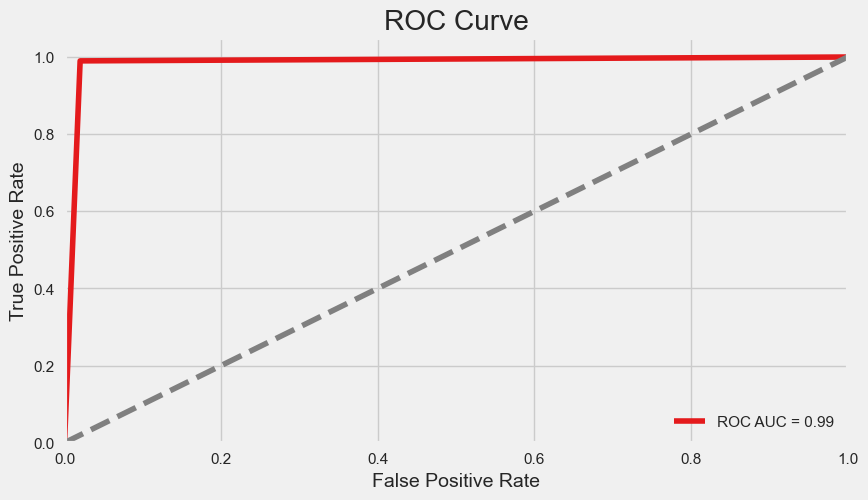

In [58]:
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, accuracy_score

y_pred_xgb_best = xgb_best_model.predict(x_test)  # Compute the predicted class labels
print("Gradient Boosting algorithm ROC score:", roc_auc_score(y_test, y_pred_xgb_best))

fpr, tpr, _ = roc_curve(y_test, y_pred_xgb_best)
f1 = f1_score(y_test, y_pred_xgb_best)

plt.figure(figsize=(9, 5))
plt.plot(fpr, tpr, label=f'ROC AUC = {roc_auc_score(y_test, y_pred_xgb_best):.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")

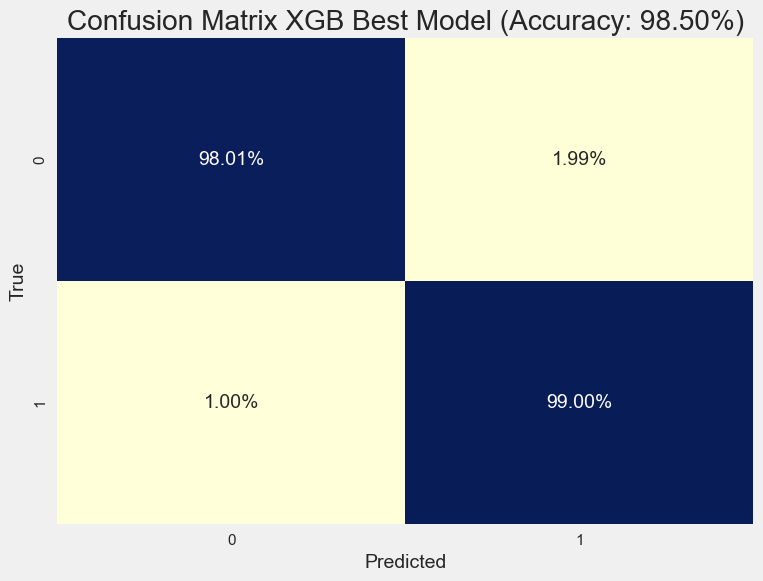

In [59]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

cm = confusion_matrix(y_test, y_pred_xgb_best)

accuracy = accuracy_score(y_test, y_pred_xgb_best)
percent_accuracy = accuracy * 100

cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(8, 6))
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='YlGnBu', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Confusion Matrix XGB Best Model (Accuracy: {percent_accuracy:.2f}%)')
plt.show()

#### Apply the best tuning XGB on unlabeled_data

In [70]:
y_pred_unlabeled = xgb_best_model.predict(data_unlabeled.drop('id', axis = 1))

In [72]:
# Double check wiht the actual label from unlabeled_data
accuracy_score(labels, y_pred_unlabeled)

0.9771428571428571

#### Combining the labels of to get Pseudo Labeled Dataset

In [73]:
# Create a pseudo label for unlabeled_data from our prediction
data_unlabeled['CLASS_LABEL'] = y_pred_unlabeled

In [74]:
#Joining the labeled and unlabeled set
pseudo_data = pd.concat([data_labeled, data_unlabeled], axis = 0)

In [75]:
pseudo_data

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
5525,5526,1,0,7,109,11,0,0,0,0,0,0,0,0,9,1,1,0,0,1,0,13,89,0,0,0,0,0.032520,0.264151,0,1,1,0,0,0.000000,0,0,0,0,1,0,0,0,1,-1,1,1,0,1,0
771,772,2,0,2,33,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,21,5,0,0,0,0,0.000000,0.000000,0,1,0,0,0,1.000000,0,0,0,0,0,0,0,0,1,1,1,1,1,-1,1
7839,7840,2,1,2,74,0,0,0,0,1,0,2,1,0,9,1,0,0,0,1,0,22,19,25,0,0,0,0.050505,0.196078,0,1,0,0,0,0.000000,0,0,0,0,0,0,0,0,1,0,1,1,0,1,0
2395,2396,2,0,7,103,1,1,0,0,1,0,1,0,0,13,1,1,0,0,1,0,26,60,9,0,2,0,0.000000,0.333333,0,1,0,0,0,0.000000,0,0,0,0,0,0,0,0,1,-1,1,1,0,1,1
1478,1479,2,0,4,61,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,16,38,0,0,0,0,0.000000,0.166667,1,1,0,0,0,0.000000,0,0,0,0,0,0,0,1,1,0,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,194,1,0,3,36,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,18,11,0,0,0,0,0.913043,1.000000,1,1,1,0,0,0.065217,1,0,0,0,0,0,0,0,1,1,-1,1,-1,-1,1
5611,5612,2,1,8,82,0,0,0,0,0,0,0,0,0,12,1,1,0,0,1,0,22,53,0,0,0,0,0.051643,0.058824,0,0,0,0,0,0.009390,0,0,0,0,1,0,0,0,1,-1,1,1,1,1,0
2901,2902,2,1,2,39,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,15,16,0,0,0,0,0.000000,0.000000,0,0,0,0,0,0.000000,0,0,0,0,0,0,0,0,1,1,1,1,1,1,0
578,579,2,0,2,38,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,13,18,0,0,0,0,1.000000,1.000000,0,1,0,0,0,0.000000,1,0,0,0,0,1,1,0,1,1,-1,1,1,-1,1


In [76]:
# Predictive analysis on Pseudo Data
from sklearn.model_selection import train_test_split

# sperate variables and prediction
y_p = pseudo_data['CLASS_LABEL']
x_p = pseudo_data.drop(['CLASS_LABEL', 'id'], axis = 1)

x_train_p,x_test_p,y_train_p,y_test_p = train_test_split(x_p,y_p,test_size=0.2,random_state=1000)

In [77]:
# Run the model on the x_train_p and y_train_p
import xgboost as xgb

xgb_model = xgb.XGBClassifier(random_state = 2023)
xgb_model.fit(x_train_p,y_train_p)

y_pred_xgb = xgb_model.predict(x_test_p)

print("Accuracy on Pseudo_labeled data: ", accuracy_score(y_pred_xgb,y_test_p)) 

Accuracy on Pseudo_labeled data:  0.993


In [78]:
probabilities = xgb_model.predict_proba(data_unlabeled.drop(['CLASS_LABEL', 'id'], axis = 1))
probabilities

array([[9.9999374e-01, 6.2747868e-06],
       [1.2993813e-05, 9.9998701e-01],
       [2.0772219e-04, 9.9979228e-01],
       ...,
       [4.9570543e-01, 5.0429457e-01],
       [2.8014183e-05, 9.9997199e-01],
       [9.9994916e-01, 5.0861694e-05]], dtype=float32)

In [79]:
b = []
for p in probabilities:
    if p[0] > 0.95:
        b.append(0)
    else:
        b.append(1)

In [88]:
print("Accuracy Score for final stage ", accuracy_score(b, labels))
print("ROC AUC Score for final stage ", roc_auc_score(b, labels))

Accuracy Score for final stage  0.9757142857142858
ROC AUC Score for final stage  0.9758823529411765


<div class="alert alert-block alert-info">
<b>Final Observation: </b> 
    
- The XGB model is performing pretty well on labeled_data and pseudo_labeled data. After joining the actual label from labeled_data and pseudo label from predicted unlabeled_data, we can see the model is still predicting well on train and test pseudo data.
    
- The final accuracy score for our XGB semi-supervised learning model is 97.57%
</div>

### 5.2 Unsupervised Learning with PCA on original data

In [83]:
# Recall train_df from the EDA above (Original Data dropping ID and CLASS LABEL)
train_df.head()

,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT
0,3,1,5,72,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,21,44,0,0,0,0,0.000,0.250000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,1,1,0,1,1,-1,1
1,3,1,3,144,0,0,0,0,2,0,2,1,0,41,1,0,0,0,0,0,17,16,103,0,1,0,0.000,0.000000,0,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,-1,1,1,1,1
2,3,1,2,58,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,27,24,0,0,0,0,0.375,1.000000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,0,-1,1,-1,0
3,3,1,6,79,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,22,50,0,0,0,1,1.000,0.095238,1,1,0,0,0,0.0,1,0,0,0,1,0,0,0,1,-1,1,1,1,-1
4,3,0,4,46,0,0,0,0,0,0,0,0,0,2,1,1,0,0,1,0,10,29,0,0,0,0,1.000,1.000000,0,0,0,1,0,0.0,1,0,0,0,0,1,0,0,1,1,-1,0,-1,-1


In [84]:
# Apply PCA and fit the all features
pca = PCA(n_components=5).fit(train_df)

In [85]:
print(pca.components_)

[[ 8.41287614e-03  9.98199162e-04  1.80565617e-02  8.14792058e-01
   3.34362066e-02  9.94814095e-04 -9.35450765e-07  1.76535803e-04
   9.67851818e-03  2.86887021e-03  1.59164249e-02  1.28779948e-02
   2.63286600e-04  1.55089138e-01  1.25317052e-04  2.83549022e-03
   3.38330727e-04  2.89028037e-04  2.76977020e-03  0.00000000e+00
   1.76259927e-02  3.95212003e-01  3.91446295e-01 -1.82380608e-06
   1.95550204e-03  1.53150183e-04 -7.93095812e-04 -4.09861602e-04
   5.99291502e-04 -2.90199260e-05  4.71083501e-04  1.03016242e-04
   1.47005205e-04 -8.17108251e-04 -1.00589830e-03  2.72990422e-05
   1.96531188e-04  6.17739034e-05  3.90575285e-04  3.68861599e-04
  -2.40361688e-04 -1.51604388e-04 -5.82633356e-04 -1.59554248e-02
  -3.61658531e-06 -3.42557178e-04 -1.34951131e-04  3.40122131e-03]
 [ 9.27633518e-03  2.79897227e-04 -3.37721151e-02  3.33516615e-03
  -5.06023207e-02 -4.18744164e-04 -5.30324077e-06 -2.26440642e-04
   7.72203589e-03  5.63633815e-03  3.35128154e-02  2.53836118e-02
   3.8572

In [86]:
print(pca.explained_variance_)

[1666.67058376  668.44797813   87.56434194   53.36426045    6.67413495]


In [87]:
print(pca.explained_variance_ratio_)

[0.66837538 0.26806387 0.03511543 0.02140036 0.00267649]


<div class="alert alert-block alert-info">
<b>First Observation: </b> 
    
- PC1 and PC2 are the two components explaining up to 93% of the orginal data. Therefore, we go further with only PC1 and PC2
</div>

In [89]:
# Transform samples using the PCA fit
pca_2d = pca.transform(train_df)

In [90]:
pca_X = pd.DataFrame(pca_2d, columns = ('PC1', 'PC2', 'PC3', 'PC4', 'PC5'))
pca_X

,PC1,PC2,PC3,PC4,PC5
0,0.477360,-12.184588,2.262479,-5.395218,-3.125685
1,94.728821,81.566855,-3.317834,18.159088,0.462818
2,-18.786230,2.009953,9.727391,-3.234249,-0.797172
3,8.631907,-16.522212,3.215193,-6.590975,-3.203209
4,-26.557032,-1.485193,-9.595845,0.755383,-1.508748
...,...,...,...,...,...
9995,-22.984372,24.320317,-3.421772,6.081286,0.933803
9996,-14.485403,-4.454375,0.343154,-3.403948,-0.875143
9997,-14.878657,-4.891924,-2.878872,2.917870,-1.468982
9998,-25.138326,19.133874,-3.526251,0.569030,0.378904


<div class="alert alert-block alert-info">
<b>KMeans Notes: </b> 
    
- We'll consider the total intra-cluster variation (or **total within-cluster sum of square (WSS)**). The goal is to minimize WSS.

- The Elbow method looks at how the total WSS varies with the number of clusters.  For that, we'll compute k-means for a range of different values of k. Then, we calculate the total WSS. We plot the curve WSS vs. number of clusters.  Finally, we locate the elbow or bend of the plot. This point is considered to be the appropriate number of clusters.
</div>

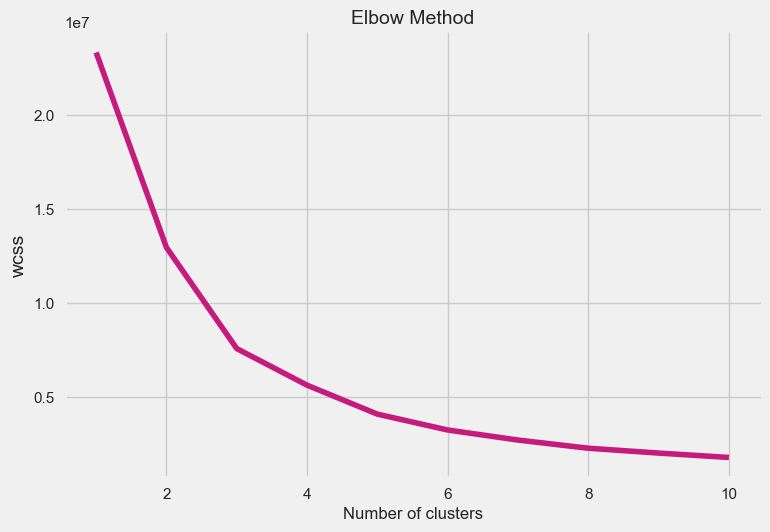

In [91]:
wcss = []
for i in range(1,11):
    km = KMeans(n_clusters=i,init='k-means++', max_iter=300, n_init=10, random_state=0)
    km.fit(pca_X[['PC1', 'PC2']])
    wcss.append(km.inertia_)
plt.plot(range(1,11),wcss, c="#c51b7d")
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.title('Elbow Method', size=14)
plt.xlabel('Number of clusters', size=12)
plt.ylabel('wcss', size=14)
plt.show()

<div class="alert alert-block alert-info">
<b>Cluster Onservation: </b> 
    
- We can see the dramatric drop in the WSS when the number of clusters changes from 1, to 2 and to 3. Then it gradually drops from the number of clusters of 4. Therefore, we think 3 clusters would be the best decision in this case.
</div>

In [92]:
# Kmeans algorithm
# n_clusters: Number of clusters. In our case 3
# init: k-means++. Smart initialization
# max_iter: Maximum number of iterations of the k-means algorithm for a single run
# n_init: Number of time the k-means algorithm will be run with different centroid seeds. 
# random_state: Determines random number generation for centroid initialization.
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=10, n_init=10, random_state=0)

# Fit and predict 
y_means = kmeans.fit_predict(pca_X)

In [95]:
pca_X['Class_pca'] = y_means

Text(0.5, 1.0, 'Phishing Email K-MEANS Clustering Using PCA')

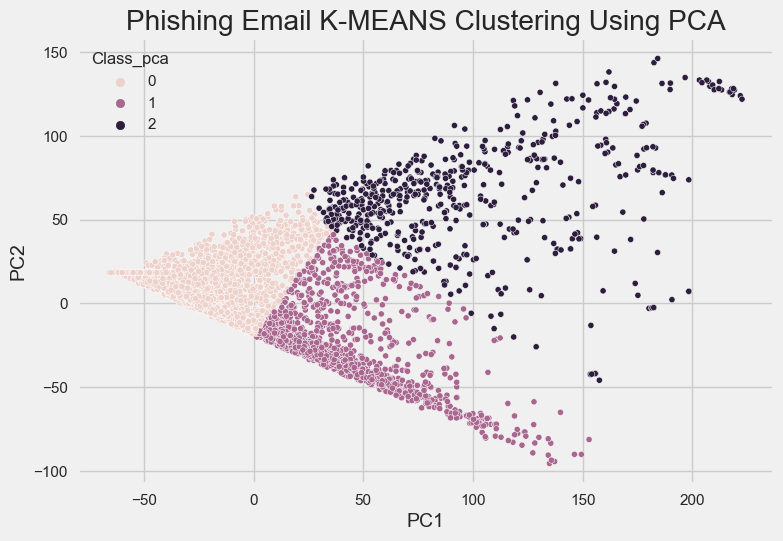

In [97]:
sns.scatterplot(x= pca_X["PC1"], y = pca_X["PC2"], hue = pca_X["Class_pca"], s=20, cmap='viridis')
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Phishing Email K-MEANS Clustering Using PCA")

### 5.3 Unsupervised Learning with Standard Deviation Grouping

![](https://www.investopedia.com/thmb/Y3QY1T88KZO1lDb9ittYB9Dz7a4=/750x0/filters:no_upscale():max_bytes(150000):strip_icc():format(webp)/LognormalandNormalDistribution1-7ffee664ca9444a4b2c85c2eac982a0d.png)

In [98]:
train_df.head()

,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT
0,3,1,5,72,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,21,44,0,0,0,0,0.000,0.250000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,1,1,0,1,1,-1,1
1,3,1,3,144,0,0,0,0,2,0,2,1,0,41,1,0,0,0,0,0,17,16,103,0,1,0,0.000,0.000000,0,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,-1,1,1,1,1
2,3,1,2,58,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,27,24,0,0,0,0,0.375,1.000000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,0,-1,1,-1,0
3,3,1,6,79,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,22,50,0,0,0,1,1.000,0.095238,1,1,0,0,0,0.0,1,0,0,0,1,0,0,0,1,-1,1,1,1,-1
4,3,0,4,46,0,0,0,0,0,0,0,0,0,2,1,1,0,0,1,0,10,29,0,0,0,0,1.000,1.000000,0,0,0,1,0,0.0,1,0,0,0,0,1,0,0,1,1,-1,0,-1,-1


In [99]:
# Create a defined function to do log transformation for numeric features
def log_transform(df, cols):
    for v in cols:
        df[v] = np.log1p(df[v])
        
    return df

In [100]:
train_df = log_transform(train_df, numeric_features)

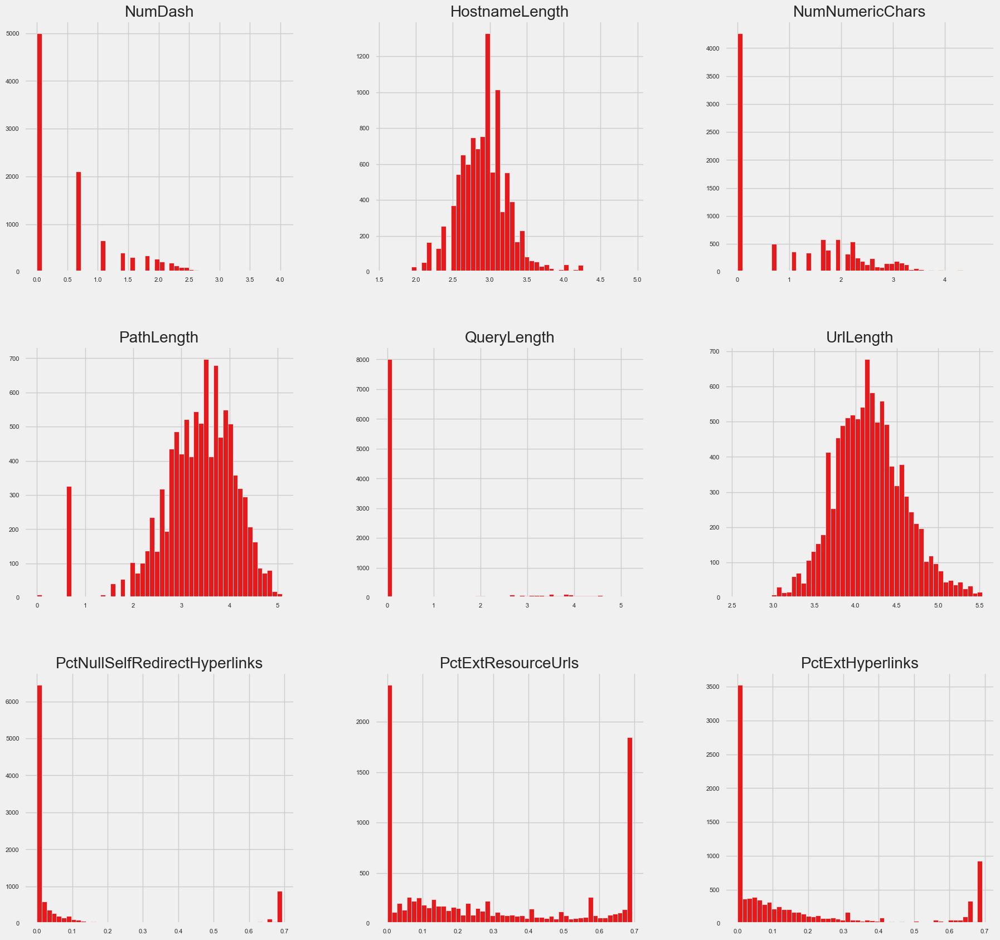

In [101]:
train_df[numeric_features].hist(figsize = (20, 20), bins = 50, xlabelsize = 8, ylabelsize = 8);

In [102]:
# Calculate the standard deviation of each feature
std = train_df.std()

In [103]:
std

NumDots                               1.346836
SubdomainLevel                        0.751214
PathLevel                             1.863241
UrlLength                             0.423251
NumDash                               0.796644
NumDashInHostname                     0.545744
AtSymbol                              0.017319
TildeSymbol                           0.113709
NumUnderscore                         1.114660
NumPercent                            0.622248
NumQueryComponents                    1.344793
NumAmpersand                          1.117356
NumHash                               0.047906
NumNumericChars                       1.191221
NoHttps                               0.105241
RandomString                          0.499390
IpAddress                             0.130023
DomainInSubdomains                    0.147341
DomainInPaths                         0.494944
HttpsInHostname                       0.000000
HostnameLength                        0.340145
PathLength   

In [104]:
# Define a function to classify the data based on 2 standard deviations
def classify(x):
    # Initialize an empty list to store the group labels
    groups = []
    # Loop through each feature
    for feature in train_df.columns:
        # Get the mean and standard deviation of the feature
        mean = train_df[feature].mean()
        sd = std[feature]
        # Check if the value is within 2 standard deviations of the mean
        if mean - 2 * sd <= x[feature] <= mean + 2 * sd:
            # If yes, assign it to group 0 or 1 based on the cluster label
            groups.append(cluster_labels[x.name])
        else:
            # If no, assign it to group -1 (to be classified later)
            groups.append(-1)
    # Return the list of group labels
    return groups

In [105]:
# Create a K-means model with 2 clusters
kmeans = KMeans(n_clusters=2, random_state=0)

# Fit the model to the data
kmeans.fit(train_df)

# Get the cluster labels for each row of the data
cluster_labels = kmeans.labels_

# Apply the classify function to each row of the data
train_df["groups"] = train_df.apply(classify, axis=1)

# Print the first 10 rows of the data with group labels
print(train_df.head(10))

   NumDots  SubdomainLevel  PathLevel  UrlLength   NumDash  NumDashInHostname  \
0     3            1            5      4.290459   0.000000          0           
1     3            1            3      4.976734   0.000000          0           
2     3            1            2      4.077537   0.000000          0           
3     3            1            6      4.382027   0.693147          0           
4     3            0            4      3.850148   0.000000          0           
5     3            1            1      3.761200   0.693147          0           
6     2            0            5      4.110874   0.000000          0           
7     1            0            3      3.433987   0.000000          0           
8     8            7            2      4.343805   0.693147          1           
9     2            0            2      3.850148   0.000000          0           

   AtSymbol  TildeSymbol  NumUnderscore  NumPercent  NumQueryComponents  \
0      0          0             0

In [106]:
import statistics

def find_mode(df, col_name):
    lst = []
    
    for i in range(0, len(df)):
        mode_i = statistics.mode(df.loc[i, col_name])
        lst.append(mode_i)
        
    return lst

In [107]:
train_df['Temp_Label'] = find_mode(train_df, 'groups')

In [108]:
train_df.head(2)

,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,groups,Temp_Label
0,3,1,5,4.290459,0.0,0,0,0,0,0,0,0,0,0.00000,1,0,0,0,0,0,3.091042,3.806662,0.000000,0,0,0,0.0,0.223144,1,1,0,0,0,0.0,0,0,0,0,0,0,0,1,1,0,1,1,-1,1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0, 0, 0, 0, 0, 0]",0
1,3,1,3,4.976734,0.0,0,0,0,2,0,2,1,0,3.73767,1,0,0,0,0,0,2.890372,2.833213,4.644391,0,1,0,0.0,0.000000,0,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,-1,1,1,1,1,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",1


In [111]:
pca_X['Label_std'] = train_df['Temp_Label']

Text(0.5, 1.0, 'Phishing Email K-MEANS Clustering Using PCA')

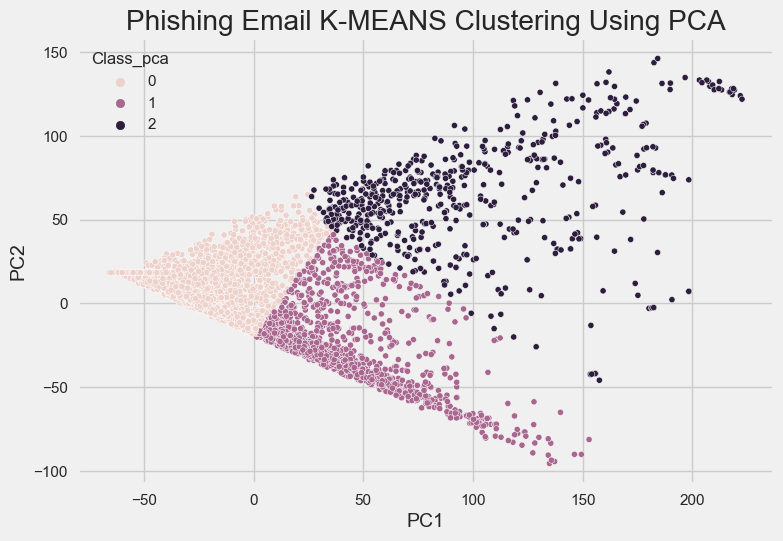

In [113]:
sns.scatterplot(x= pca_X["PC1"], y = pca_X["PC2"], hue = pca_X["Class_pca"], s=20, cmap='viridis')
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Phishing Email K-MEANS Clustering Using PCA")

Text(0.5, 1.0, 'Phishing Email K-MEANS Clustering and Standard Deviation')

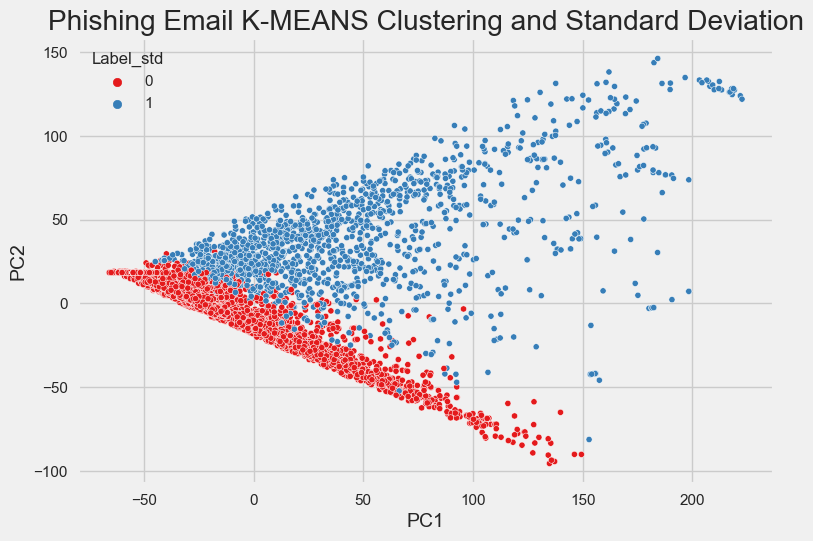

In [112]:
sns.scatterplot(x= pca_X["PC1"], y = pca_X["PC2"], hue = pca_X["Label_std"], s=20, cmap='viridis')
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Phishing Email K-MEANS Clustering and Standard Deviation")

In [114]:
pca_X['Actual_Label'] = df['CLASS_LABEL']

Text(0.5, 1.0, 'Phishing Email with Actual Label on PC1 and PC2')

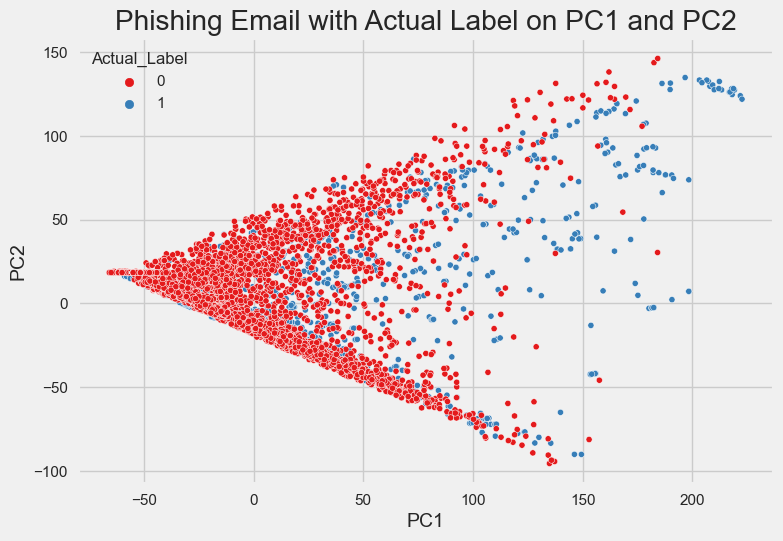

In [119]:
sns.scatterplot(x= pca_X["PC1"], y = pca_X["PC2"], hue = pca_X["Actual_Label"], s=20, cmap='viridis')
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Phishing Email with Actual Label on PC1 and PC2")

In [120]:
print("Accuracy score for Kmeans and PCA: ", accuracy_score(pca_X["Actual_Label"], pca_X["Class_pca"]))

Accuracy score for Kmeans and PCA:  0.402


In [121]:
print("Accuracy score for Kmeans and Standard Deviation: ", accuracy_score(pca_X["Actual_Label"], pca_X["Label_std"]))

Accuracy score for Kmeans and Standard Deviation:  0.4326


<div class="alert alert-block alert-success">
<b>Conclusion:</b> 
    
After getting done all steps including EDA, Data Processing, PCA and Hyperparameter Tuning, we have got the results so far:
    
**Semi-supervised Learning by XGB Model **:
- Accuracy Score for final stage:  0.9757142857142858
- ROC AUC Score for final stage:  0.9758823529411765
    
**Unsupervised Learning with KMeans and PCA**
- Accuracy score for Kmeans and PCA:  0.402

**Unsupervised Learning with KMeans and Standard Deviation**
- Accuracy score for Kmeans and Standard Deviation:  0.4326
    
    
In this assignment, we want to explore and experience the toughness of semi-supervised and unsupervised learnings. With the result of self-training semi-supervised learning XGB model, we have got the high accuracy of 97.5%. However, it's a bit tough for unsupervised learning approaches but we have learnt a lot from the whole process of finding the unknown from the data.

    
**Further Strategies**
- We can further explore other unsupervised approaches to answer this problem or start combing the two existing methods at the moment and find a way to better the label prediction.
</div>